In [1]:
!pip install svgpath2mpl
!pip install gym

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.7/721.7 kB 50.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827632 sha256=db667079ecb862fe99f198b0941d879c1288a97527c7dbad89af93269465bd37
  Stored in directory: /root/.cache/pip/wheels/af/2b/30/5e78b8b9599f2a2286a582b8da80594f654bf0e18d825a4405
Successfully built gym


In [2]:
from collections import namedtuple
import numpy as np
import torch
import torch.nn as nn
import imageio
from svgpath2mpl import parse_path
import matplotlib.pyplot as plt
import matplotlib
from scipy.ndimage import rotate, shift
from matplotlib.animation import FuncAnimation
from environments.shared_wildfire_gym import SharedWildFireGym
from networks.ppo_net import PPONet
import torch.nn.functional as F

In [3]:

n_actions = 4
height = width = 100
channels = 2
EPISODES_PER_BATCH = 1
TRAIN_FREQ  = 10
SAVE_FREQ = 10
GAMMA = 0.95
CLIP  = 0.2
N_DRONES = 2

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PPONet(device,  channels, height, width, n_actions).to(device)
model.load_state_dict(torch.load(f'./mappo_weights.pt'))

<All keys matched successfully>

/tmp/ipykernel_32/1284105280.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 5, figsize=(28, 4))


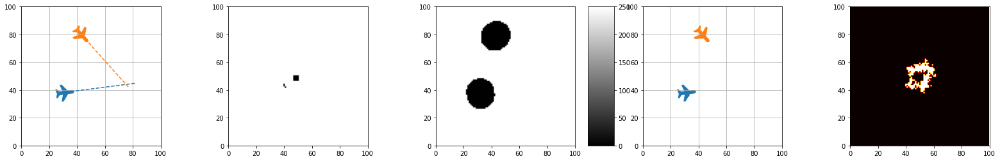

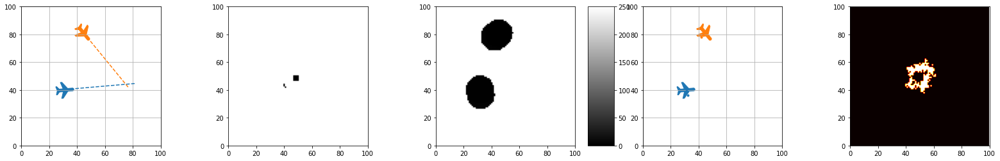

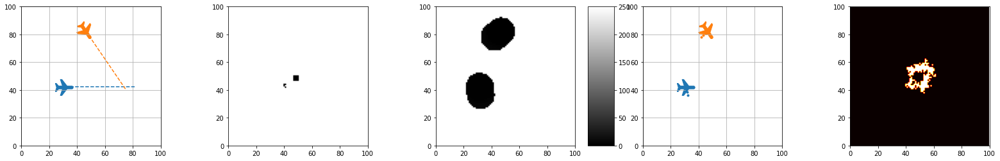

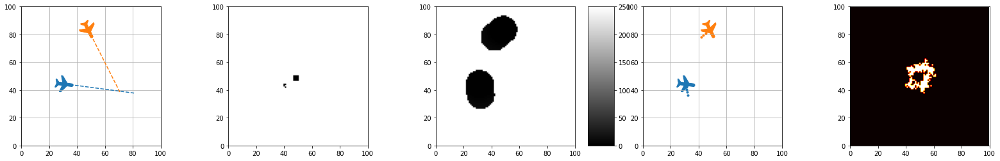

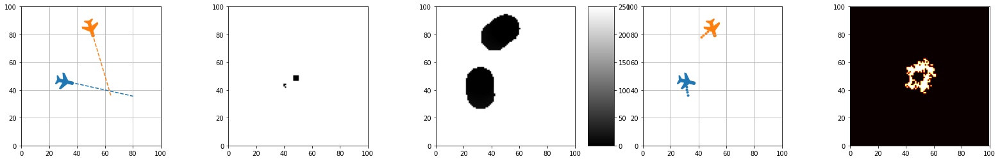

...

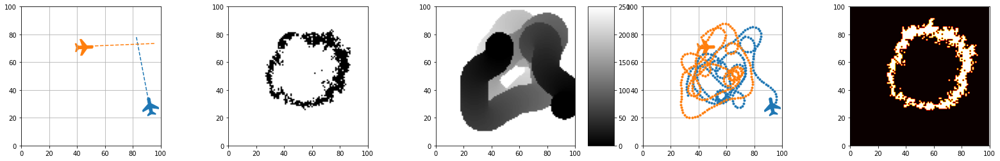

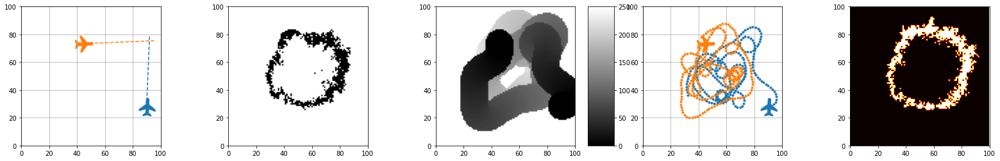

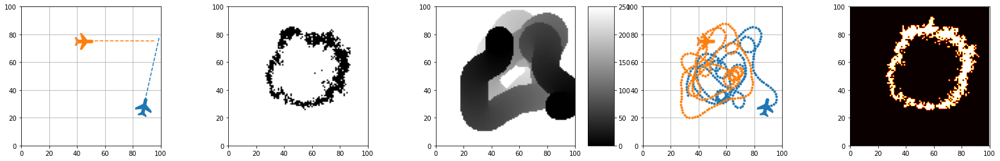

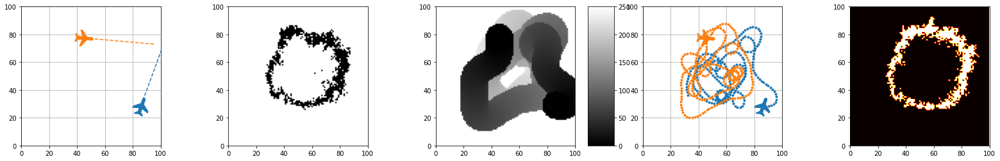

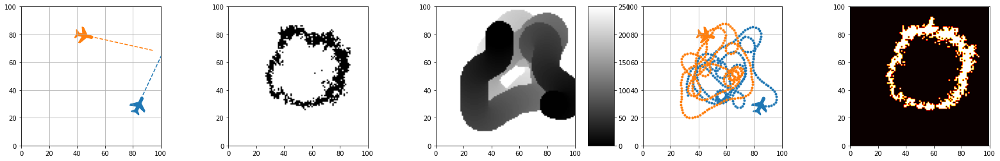

In [5]:
loss = None
i_episode = 1
images = []

wildFireGym = SharedWildFireGym()
observation = wildFireGym.reset()


while True:
  
  belief_map = torch.tensor(observation['belief_map'], device=device, dtype=torch.float)

  state_vector = torch.tensor(observation['state_vector'], device=device, dtype=torch.float)
  
  logits, _ = model(belief_map, state_vector)
  
  policy = F.softmax(logits, dim=1)

  action_item = torch.argmax(policy).item()

  action_vector = None
  if action_item  == 0:
      action_vector = [0, 0]
  elif action_item == 1:
      action_vector = [0, 1]
  elif action_item == 2:
      action_vector = [1, 0]
  else:
      action_vector = [1, 1]
  
  next_observation, rewards, done, _ = wildFireGym.step(action_vector)

  observation = next_observation

  fig, ax = plt.subplots(1, 5, figsize=(28, 4))
  wildFireGym.render(fig, ax)
  fig.canvas.draw() 
  image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
  image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
  images.append(image)
  
  if done:

    break



kwargs_write = {'fps':5.0, 'quantizer':'nq'}
imageio.mimsave('./mappo_example.gif', images, fps=5)